## Perceptron Trick

In [5]:
from sklearn.datasets import make_classification
import numpy as np
x, y = make_classification(n_samples=100, n_features=2, n_informative=1,n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=10)

#made classification data

In [2]:
import matplotlib.pyplot as plt

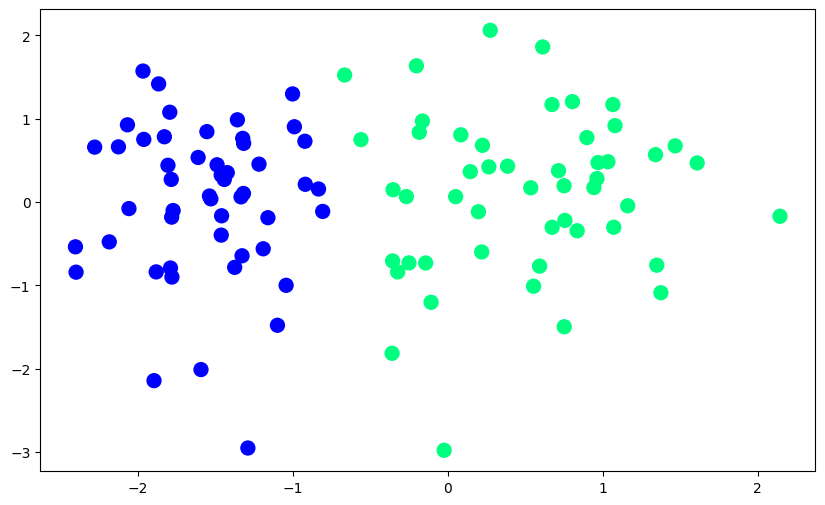

In [ ]:
plt.figure(figsize=(10,6))
plt.scatter(x[:,0],x[:,1],c=y,cmap='winter',s=100)

#target : 1 -> green , 0 -> blue

In [9]:
def step(z):
    return 1 if z>0 else 0

In [ ]:
def perceptron(x,y):
    '''returns weights and coffients'''

    x = np.insert(x,0,1,axis=1)
    #it will add column on beginning which presents the biases(bias term ke liye har row ke aage 1 laga diya)
    weights = np.ones(x.shape[1])
    #return [1,1,1] -> first 1 : conefficent c, 2nd and 3rd weight w1,w2
    lr = 0.1 #learning rate

    for i in range(1000):
        #selecting random integer (student out of 1k)
        j = np.random.randint(0,100) #ex: pickaed 41th number stu j = 41

        y_hat = step(np.dot(x[j],weights))
        #x= 41, x[41],[1,1,1] dot product

        weights = weights + lr * (y[j]-y_hat)*x[j]

    return weights[0],weights[1:]


In [12]:
np.dot(np.insert(x[41],0,1),[1,1,1])
#adding 1 for bias as we know it previous

np.float64(0.2946000908036748)

In [16]:
step(-0.294)

0

In [17]:
y[41]

np.int64(0)

In [13]:
intercept_,coef_ = perceptron(x,y)

In [14]:
print(coef_)
print(intercept_)

[1.32959674 0.10705749]
1.0


In [18]:
#thruough that eq ax+by+c= 0 getting into y = mx+b

In [19]:
m = (coef_[0]/coef_[1])
b = (intercept_/coef_[1])

In [20]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + b

(-3.0, 2.0)

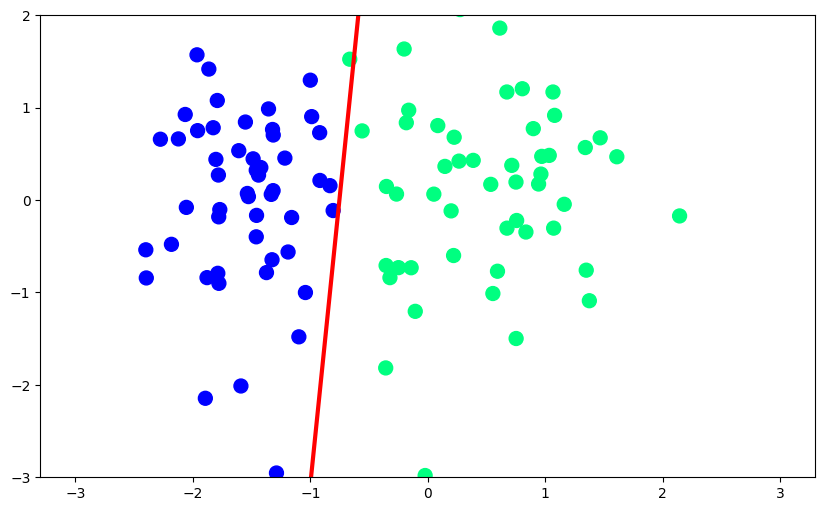

In [21]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

In [26]:
def perceptron(X, y):
    m = []
    b = []

    X = np.insert(X, 0, 1, axis=1)   # add bias term
    weights = np.ones(X.shape[1])
    lr = 0.1

    for i in range(200):
        j = np.random.randint(0, X.shape[0])

        y_hat = step(np.dot(X[j], weights))
        weights = weights + lr * (y[j] - y_hat) * X[j]

        m.append(-(weights[1] / weights[2]))
        b.append(-(weights[0] / weights[2]))

    return m, b


In [27]:
m,b = perceptron(x,y)

In [28]:
%matplotlib notebook
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation

In [36]:
fig, ax = plt.subplots(figsize=(9,5))

x_i = np.arange(-3, 3, 0.1)
y_i = x_i*m[0] +b[0]
ax.scatter(X[:,0],x[:,1],c=y, cmap='winter',s=100)
line, = ax.plot(x_i, x_i*m[0] +b[0] , 'r-', linewidth=2)
plt.ylim(-3,3)

def update(i):
    label = 'epoch {0}'.format(i +1)
    line.set_ydata(x_i*m[i] + b[i])
    ax.set_xlabel(label)
# return Line, ax

anim = FuncAnimation(fig, update, repeat=True, frames=200, interval=100)

<IPython.core.display.Javascript object>

In [38]:
HTML(anim.to_html5_video())


In [39]:
from IPython.display import HTML
HTML(anim.to_jshtml())
